# Generating Noise 

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import numpy as np
import os
import cv2
from google.colab.patches import cv2_imshow
from matplotlib import pyplot as plt

## Get Data 

In [ ]:
!ls 'drive/MyDrive/offline/Data/computer_vision/FloodNet_Resize/FloodNet Challenge @ EARTHVISION 2021 - Track 1/Train/Unlabeled/image/'

6466.jpg  6934.jpg  7594.jpg


In [ ]:
IMG_PATH = 'drive/MyDrive/offline/Data/computer_vision/FloodNet_Resize/FloodNet Challenge @ EARTHVISION 2021 - Track 1/Train/Unlabeled/image/'
image_name_1 = '6466.jpg'
image_name_2 = '6934.jpg'
image_name_3 = '7594.jpg'

img1 = cv2.imread(IMG_PATH + image_name_1)
img2 = cv2.imread(IMG_PATH + image_name_2)
img3 = cv2.imread(IMG_PATH + image_name_3)


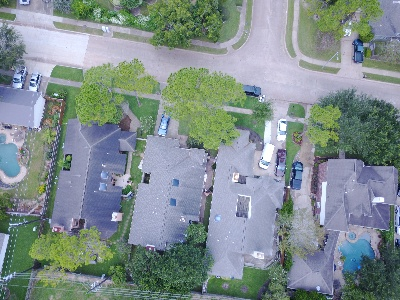

In [ ]:
cv2_imshow(img1)

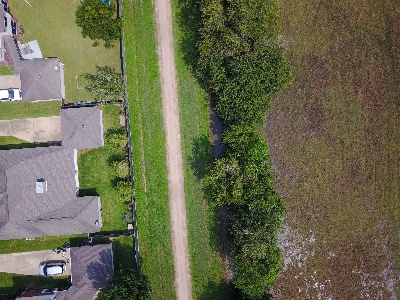

In [ ]:
cv2_imshow(img2)

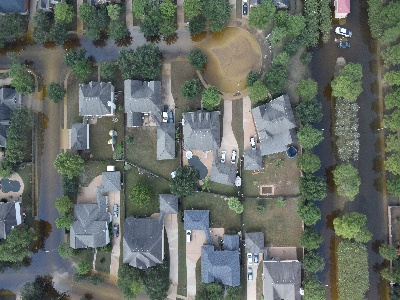

In [ ]:
cv2_imshow(img3)

## Generate Noise on Images

In [ ]:
def noisy(noise_typ, image):
  '''
  parameters
  -----------
  image: ndarray
    Input image data. Will be converted to float
  mode: str
    One of the following strings, selecting the type of noise to add:
    'gauss'     Gaussian-distribution additive noise
    'poisson'   Poisson-distributed noise generated from the data
    's&p'       Replace random pixels with 0 or 1.
    'speckle'   Multiplicative noise using out = image + n*image, where n is 
                uniform noise with specified mean & variance. 
  '''

  if noise_typ == 'gauss':
    row, col, ch = image.shape
    mean = 40
    var = 0.8
    sigma = var ** 0.5
    gauss = np.random.normal(mean, sigma, (row, col, ch))
    gauss = gauss.reshape(row, col, ch)
    noisy = image + gauss
    return noisy
  elif noise_typ == 's&p':
    row, col, ch = image.shape
    s_vs_p = 0.5
    amount = 0.004
    out = np.copy(image)
    # Salt mode
    num_salt = np.ceil(amount * image.size * s_vs_p)
    coords = [np.random.randint(0, i - 1, int(num_salt))
              for i in image.shape]
    out[coords] = 1

    # Pepper mode
    num_pepper = np.ceil(amount* image.size * ( 1.  - s_vs_p))
    coords = [np.random.randint(0, i - 1, int(num_pepper))
              for i in image.shape]
    out[coords] = 0
    return out 
  elif noise_typ == 'poisson':
    vals = len(np.unique(image))
    vals = 2 ** np.ceil(np.log2(vals))
    noisy = np.random.poisson(image * vals) / float(vals)
    return noisy
  elif noise_typ == 'speckle':
    row, col, ch = image.shape
    gauss = np.random.randn(row, col, ch)
    gauss = gauss.reshape(row, col, ch)
    noisy = image + image * gauss
    return noisy



## Gaussian: $\mathrm{u} = 40$ and $σ = 0.8$ 


In [ ]:
img1_gaussian = noisy('gauss', img1)
img2_gaussian = noisy('gauss', img2)
img3_gaussian = noisy('gauss', img3)


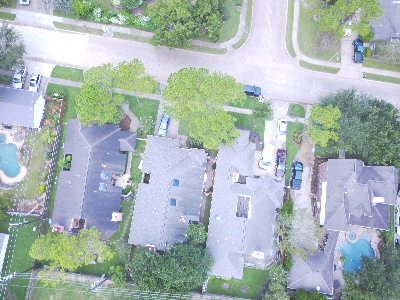

In [ ]:
cv2_imshow(img1_gaussian)

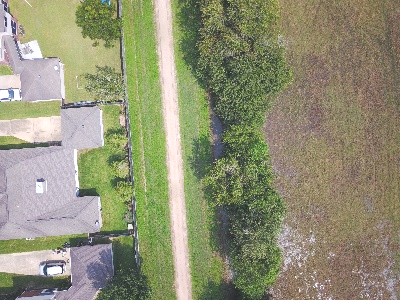

In [ ]:
cv2_imshow(img2_gaussian)

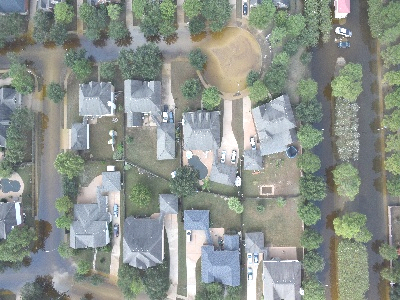

In [ ]:
cv2_imshow(img3_gaussian)

## Salt-and-Pepper with p = 0.004 and s_vs_p = 0.5


In [ ]:
img1_salt = noisy('s&p', img1)
img2_salt = noisy('s&p', img2)
img3_salt = noisy('s&p', img3)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:34: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:40: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.


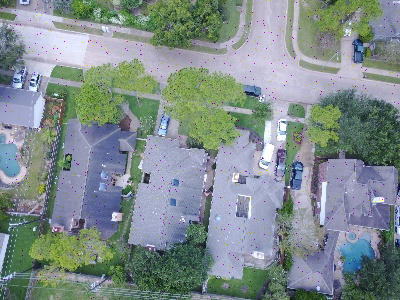

In [ ]:
cv2_imshow(img1_salt)

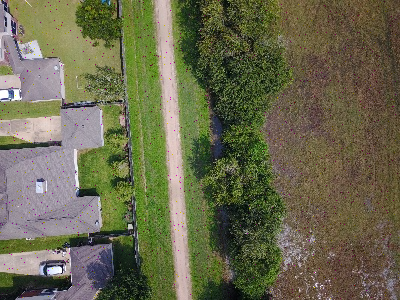

In [ ]:
cv2_imshow(img2_salt)

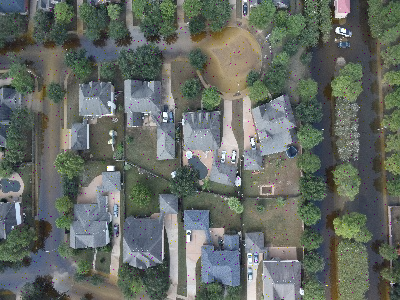

In [ ]:
cv2_imshow(img3_salt)

## Poisson Noise

In [ ]:
img1_poisson = noisy('poisson', img1)
img2_poisson = noisy('poisson', img2)
img3_poisson = noisy('poisson', img3)


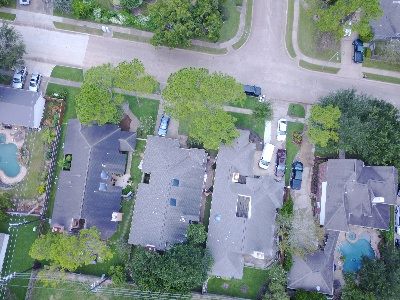

In [ ]:
cv2_imshow(img1_poisson)

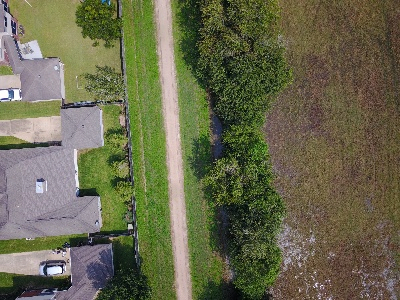

In [ ]:
cv2_imshow(img2_poisson)

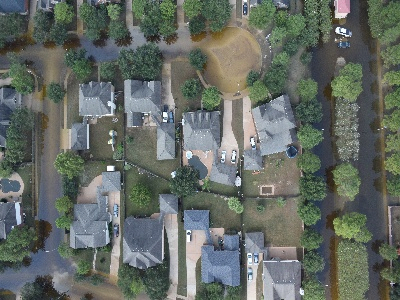

In [ ]:
cv2_imshow(img3_poisson)

## Speckle

In [ ]:
img1_speckle = noisy('speckle', img1)
img2_speckle = noisy('speckle', img2)
img3_speckle = noisy('speckle', img3)

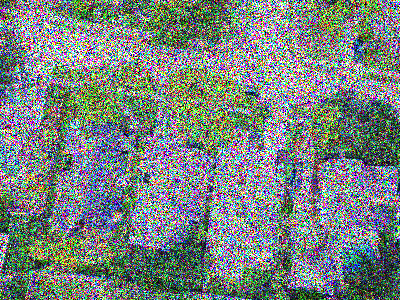

In [ ]:
cv2_imshow(img1_speckle)

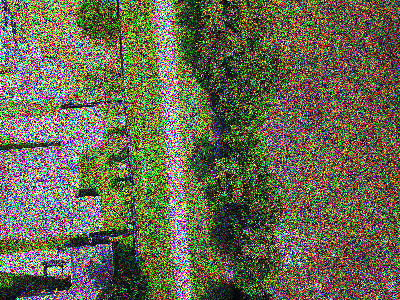

In [ ]:
cv2_imshow(img2_speckle)

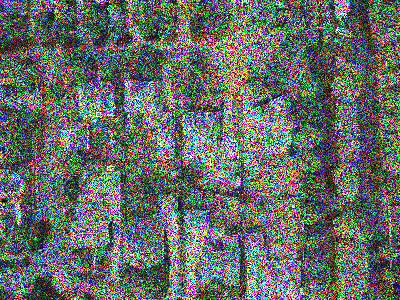

In [ ]:
cv2_imshow(img3_speckle)

## Finding and Estimating the Noise 

In [ ]:
#img = cv2.imread('drive/MyDrive/offline/Github/computer_vision/Cameraman.bmp')
gray_original = cv2.cvtColor(img2, cv2.COLOR_BGR2GRAY)

In [ ]:
gray_original.shape

(300, 400)

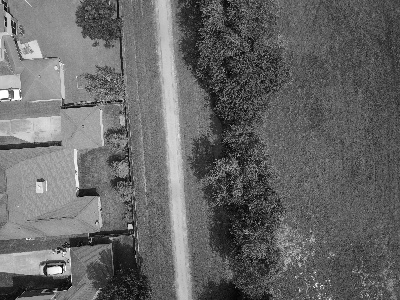

In [ ]:
cv2_imshow(gray_original)

In [ ]:
cv2_imshow(gray_original[:30, 370:])

In [ ]:
row, col = gray_original.shape
gauss = np.random.normal(40, 0.8, (row, col))
noisy_img = gray_original + gauss
smooth_part = noisy_img[:40, 30:70]

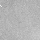

In [ ]:
cv2_imshow(smooth_part)

In [ ]:
from scipy.stats import norm
import seaborn as sns
import warnings 

warnings.filterwarnings("ignore")

In [ ]:
mu, std = norm.fit(smooth_part)

In [ ]:
print(mu, std)

181.35533709105366 6.8494324370000506


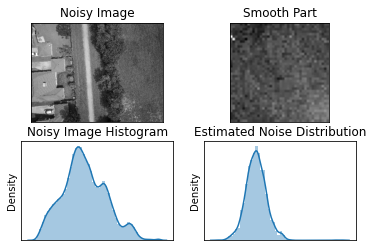

In [ ]:
plt.subplot(221),plt.imshow(noisy_img,cmap = 'gray')
plt.title('Noisy Image'), plt.xticks([]), plt.yticks([])
plt.subplot(222),plt.imshow(smooth_part,cmap = 'gray')
plt.title('Smooth Part'), plt.xticks([]), plt.yticks([])
plt.subplot(223),sns.distplot(noisy_img.ravel(), hist=True)#; plt.show()
#plt.subplot(223),plt.hist(noisy_img.ravel(),300,[0,400])#; plt.show()
plt.title('Noisy Image Histogram'), plt.xticks([]), plt.yticks([])
#p = norm.pdf(smooth_part.ravel(), mu, std)
# plt.subplot(224),plt.hist(smooth_part.ravel(),300,[0,400], density=True)#; plt.show()
plt.subplot(224),sns.distplot(smooth_part.ravel(), hist=True)#; plt.show()

plt.title('Estimated Noise Distribution'), plt.xticks([]), plt.yticks([])
plt.show()

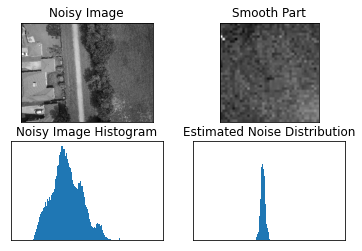

In [ ]:
plt.subplot(221),plt.imshow(noisy_img,cmap = 'gray')
plt.title('Noisy Image'), plt.xticks([]), plt.yticks([])
plt.subplot(222),plt.imshow(smooth_part,cmap = 'gray')
plt.title('Smooth Part'), plt.xticks([]), plt.yticks([])
#plt.subplot(223),sns.distplot(noisy_img.ravel(), hist=True)#; plt.show()
plt.subplot(223),plt.hist(noisy_img.ravel(),300,[0,400])#; plt.show()
plt.title('Noisy Image Histogram'), plt.xticks([]), plt.yticks([])
#p = norm.pdf(smooth_part.ravel(), mu, std)
plt.subplot(224),plt.hist(smooth_part.ravel(),300,[0,400], density=True)#; plt.show()
#plt.subplot(224),sns.distplot(smooth_part.ravel(), hist=True)#; plt.show()

plt.title('Estimated Noise Distribution'), plt.xticks([]), plt.yticks([])
plt.show()

In [ ]:
np.average(smooth_part.ravel())

181.35533709105366

In [ ]:
print(np.average(img1_gaussian - img1))

40.00106696860942


## Estimating Means Another Way

### Geometric Mean

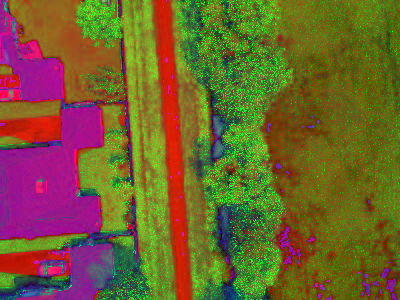

In [ ]:
#img2 = cv2.imread(IMG_PATH + image_name_2, cv2.IMREAD_GRAYSCALE).astype(float)
# img2 = cv2.imread(IMG_PATH + image_name_2, cv2.COLOR_BGR2YUV)
# img2 = cv2.imread(IMG_PATH + image_name_2, cv2.COLOR_BGR2HSV)
hsv  = cv2.cvtColor(img2, cv2.COLOR_BGR2HSV)

rows, cols = hsv.shape[:2]
ksize = 5
cv2_imshow(hsv)

In [ ]:
img2.shape[:2]

(300, 400)

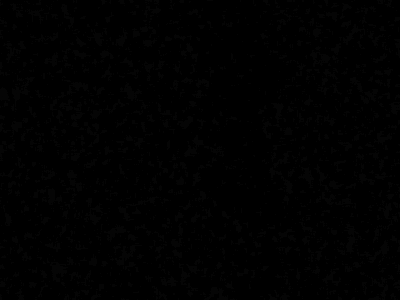

In [ ]:
padsize = int((ksize-1)/2)
pad_img = cv2.copyMakeBorder(img2, *[padsize]*4, cv2.BORDER_DEFAULT)
geomean1 = np.zeros_like(img2)
for r in range(rows):
  for c in range(cols):
    geomean1[r, c] = np.prod(pad_img[r:r+ksize, c:c+ksize])**(1/(ksize**2))
geomean1 = np.uint8(geomean1)
cv2_imshow(geomean1)

In [ ]:
# print(geomean1)
# lots of small numbers, thus almost all black

In [ ]:
geomean2 = np.uint8(np.exp(cv2.boxFilter(np.log(img2), -1, (ksize, ksize ))))
cv2_imshow(geomean2)

error: ignored

In [ ]:
print(np.array_equal(geomean1, geomean2))

False


In [ ]:
print(geomean1 - geomean2)

[[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]


In [ ]:
from scipy.stats import gmean

/usr/local/lib/python3.7/dist-packages/scipy/stats/stats.py:283: RuntimeWarning: divide by zero encountered in log
  log_a = np.log(a)


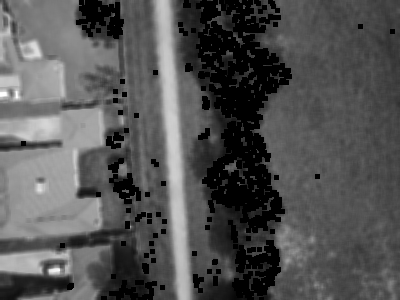

In [ ]:
padsize = int((ksize-1)/2)
pad_img = cv2.copyMakeBorder(img2, *[padsize]*4, cv2.BORDER_DEFAULT)
geomean1 = np.zeros_like(img2)
for r in range(rows):
  for c in range(cols):
    geomean1[r, c] = gmean(pad_img[r:r+ksize, c:c+ksize].ravel())
geomean1 = np.uint8(geomean1)
cv2_imshow(geomean1)

#Arithmetic 

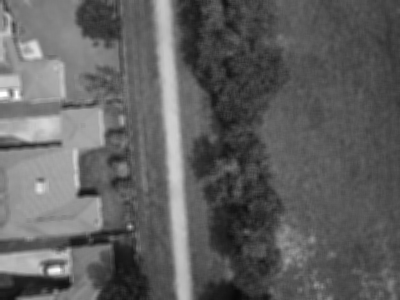

In [ ]:
padsize = int((ksize-1)/2)
pad_img = cv2.copyMakeBorder(img2, *[padsize]*4, cv2.BORDER_DEFAULT)
arithmean1 = np.zeros_like(img2)
for r in range(rows):
  for c in range(cols):
    arithmean1[r, c] = np.average(pad_img[r:r+ksize, c:c+ksize])
arithmean1 = np.uint8(arithmean1)
cv2_imshow(arithmean1)

### Gaussian/Weighted Mean

In [ ]:
figure_size = 5
img2_gaussian = cv2.GaussianBlur(img2, (figure_size, figure_size), 0)

In [ ]:
print(img2_gaussian)

[[[138 122 127]
  [118 102 107]
  [ 92  77  81]
  ...
  [ 49  66  82]
  [ 52  69  86]
  [ 53  70  87]]

 [[141 125 131]
  [121 105 110]
  [ 90  74  78]
  ...
  [ 48  65  81]
  [ 51  68  85]
  [ 52  69  86]]

 [[150 135 141]
  [130 114 120]
  [ 95  78  82]
  ...
  [ 46  65  80]
  [ 49  68  84]
  [ 50  69  85]]

 ...

 [[ 28  24  22]
  [ 27  23  22]
  [ 26  23  21]
  ...
  [ 72  81  90]
  [ 61  75  84]
  [ 58  74  83]]

 [[ 27  23  20]
  [ 26  23  20]
  [ 26  22  19]
  ...
  [ 75  84  92]
  [ 59  74  83]
  [ 53  72  81]]

 [[ 25  22  19]
  [ 25  22  19]
  [ 25  22  19]
  ...
  [ 76  85  93]
  [ 57  74  82]
  [ 51  72  79]]]


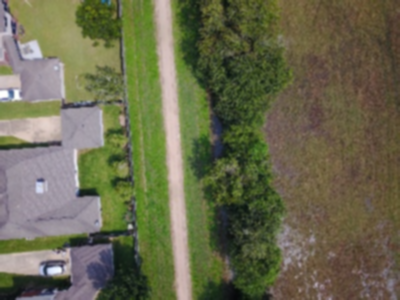

In [ ]:
cv2_imshow(img2_gaussian)

### Harmonic

In [ ]:
from scipy.stats import hmean

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:6: RuntimeWarning: divide by zero encountered in long_scalars
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:6: RuntimeWarning: divide by zero encountered in reciprocal
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:6: RuntimeWarning: invalid value encountered in reciprocal
  


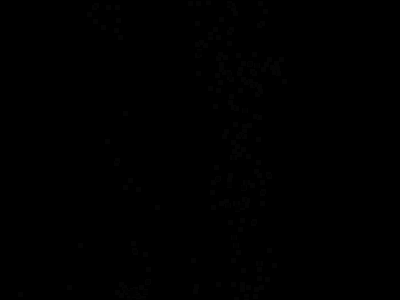

In [ ]:
padsize = int((ksize-1)/2)
pad_img = cv2.copyMakeBorder(img2, *[padsize]*4, cv2.BORDER_DEFAULT)
harmonic1 = np.zeros_like(img2)
for r in range(rows):
  for c in range(cols):
    harmonic1[r, c] = ksize/(sum(np.reciprocal(pad_img[r:r+ksize, c:c+ksize].ravel())))
harmonic1 = np.uint8(harmonic1)
cv2_imshow(harmonic1)

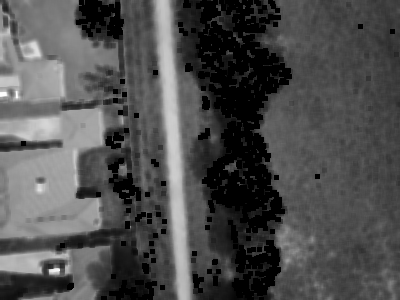

In [ ]:
padsize = int((ksize-1)/2)
pad_img = cv2.copyMakeBorder(img2, *[padsize]*4, cv2.BORDER_DEFAULT)
harmonic1 = np.zeros_like(img2)
for r in range(rows):
  for c in range(cols):
    harmonic1[r, c] = hmean(pad_img[r:r+ksize, c:c+ksize].ravel())
harmonic1 = np.uint8(harmonic1)
cv2_imshow(harmonic1)

In [ ]:
print(harmonic1)

[[[ 93  93  93]
  [ 94  94  94]
  [102 102 102]
  ...
  [ 64  64  64]
  [ 65  65  65]
  [ 65  65  65]]

 [[102 102 102]
  [102 102 102]
  [107 107 107]
  ...
  [ 64  64  64]
  [ 65  65  65]
  [ 65  65  65]]

 [[109 109 109]
  [108 108 108]
  [112 112 112]
  ...
  [ 64  64  64]
  [ 65  65  65]
  [ 65  65  65]]

 ...

 [[ 31  31  31]
  [ 30  30  30]
  [ 29  29  29]
  ...
  [ 90  90  90]
  [ 92  92  92]
  [ 97  97  97]]

 [[ 28  28  28]
  [ 27  27  27]
  [ 26  26  26]
  ...
  [ 87  87  87]
  [ 89  89  89]
  [ 93  93  93]]

 [[ 25  25  25]
  [ 25  25  25]
  [ 24  24  24]
  ...
  [ 87  87  87]
  [ 89  89  89]
  [ 93  93  93]]]


### Mean Filter

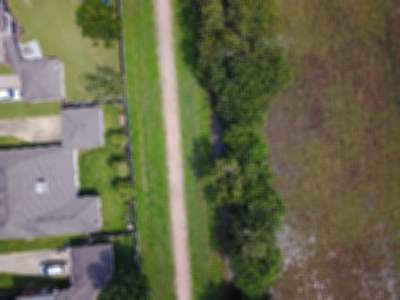

In [ ]:
# cv2.GaussianBlur(img2, (figure_size, figure_size), 0)

mean_img2 = cv2.blur(img2, (figure_size, figure_size))
cv2_imshow(mean_img2)

## Implement Image Sharpening Method 

In [ ]:
kernel_sharpen_1 = np.array([[-1, -1, -1], [-1, 9, -1], [-1, -1, -1]])
kernel_sharpen_2 = np.array([[1, 1, 1], [1, -7, 1], [1, 1, 1]])
#kernel_sharpen_3 = np.array([[-1, -1, -1, -1, -1], 
#                             [-1,2,2,2,-1],
#                             [-1,2,8,2,-1],
#                             [-1,2,2,2-1],
#                             [-1,-1,-1,-1,-1]]) / 8.0

### geometric mean

In [ ]:
# create the kernels

output_1 = cv2.filter2D(geomean1, -1, kernel_sharpen_1)
output_2 = cv2.filter2D(geomean1, -1, kernel_sharpen_2)
# output_3 = cv2.filter2D(geomean1, -1, kernel_sharpen_3)


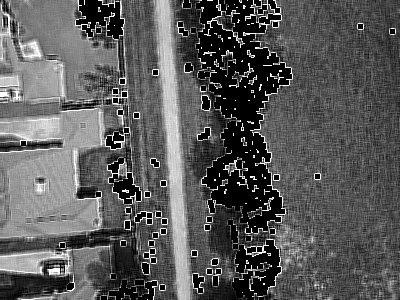

In [ ]:
cv2_imshow(output_1)

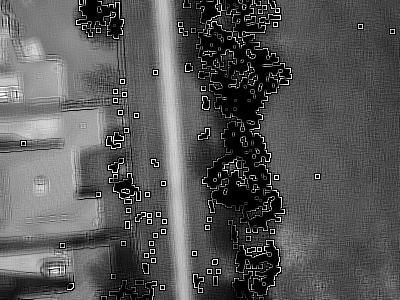

In [ ]:
cv2_imshow(output_2)

### Arithmetic

In [ ]:
output_1_arith = cv2.filter2D(arithmean1, -1, kernel_sharpen_1)
output_2_arith = cv2.filter2D(arithmean1, -1, kernel_sharpen_2)

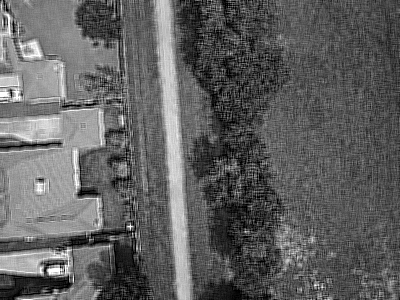

In [ ]:
cv2_imshow(output_1_arith)

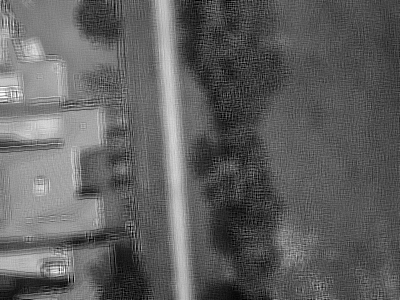

In [ ]:
cv2_imshow(output_2_arith)

### Gaussian

In [ ]:
output_1_gaussian = cv2.filter2D(img2_gaussian, -1, kernel_sharpen_1)
output_2_gaussian = cv2.filter2D(img2_gaussian, -1, kernel_sharpen_2)

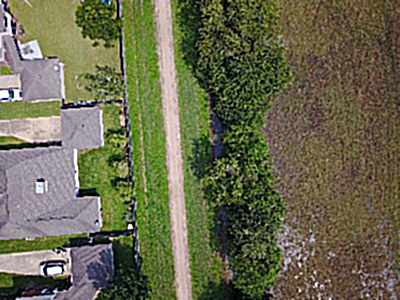

In [ ]:
cv2_imshow(output_1_gaussian)

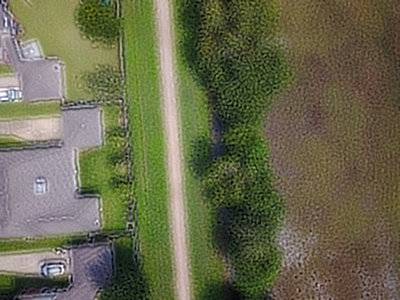

In [ ]:
cv2_imshow(output_2_gaussian)

### Harmonic

In [ ]:
sharpen_1_harmo = cv2.filter2D(harmonic1, -1, kernel_sharpen_1)
sharpen_2_harmo = cv2.filter2D(harmonic1, -1, kernel_sharpen_2)

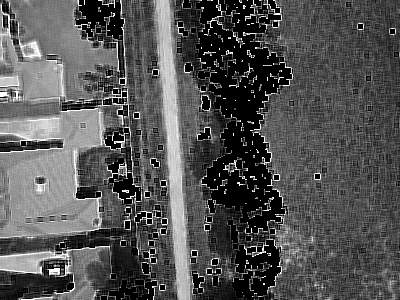

In [ ]:
cv2_imshow(sharpen_1_harmo)

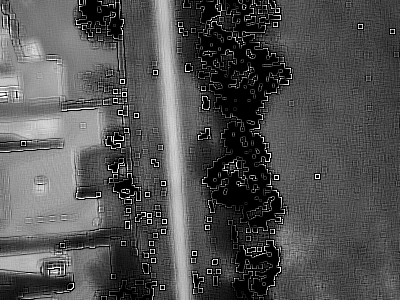

In [ ]:
cv2_imshow(sharpen_2_harmo)

### Mean Filter

In [ ]:
sharpen_1_mean = cv2.filter2D(mean_img2, -1, kernel_sharpen_1)
sharpen_2_mean = cv2.filter2D(mean_img2, -1, kernel_sharpen_2)

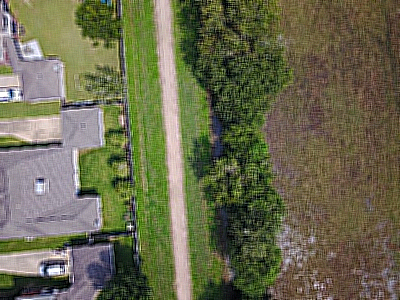

In [ ]:
cv2_imshow(sharpen_1_mean)

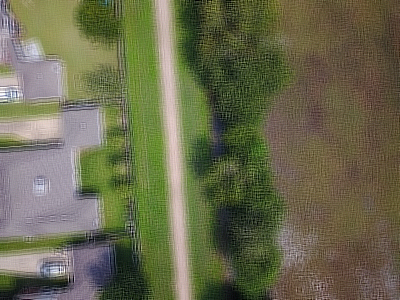

In [ ]:
cv2_imshow(sharpen_2_mean)

## Applying Class of Means

adopted from https://machinelearningmastery.com/arithmetic-geometric-and-harmonic-means-for-machine-learning/

$Arithmetic \: Mean = (x_1 + x_2 + X_n) / n$  

*   The arithmetic mean is appopriate when all values in the data sample have the same units of measure, e.g. all numbers are heights or dollar or miles
*   The arithmetic mean can be easily distorted if the sample of observations contain outliers (a few values far away in feature space from all other values), or for data that has a non-Gaussian distribution (e.g. multiple peaks, a so-called multi-modal probability distribution).



 

In [ ]:
arith_mean = np.mean(img2)
print('Airthmetic Mean: %.3f' % arith_mean)

Airthmetic Mean: 96.552


$Geometric \: Mean = n^{root}(x_1 * x_2 * ... * x_n)$



*   The geometric mean is appropriate when the data contains values with different units of measure e.g. some measure are height, some are dollars, some are miless 
*   The geometric mean does not accept negative or zero values. All values must be positive. 



In [ ]:
from scipy.stats import gmean

In [ ]:
geom_mean_0 = gmean(img2[0, :, 0])
geom_mean_1 = gmean(img2[0, :, 1])
geom_mean_2 = gmean(img2[0, :, 2])
print('Geometric Mean for the first row and first channel: %.3f'% geom_mean_0)
print('Geometric Mean for the first row and first channel: %.3f'% geom_mean_1)
print('Geometric Mean for the first row and first channel: %.3f'% geom_mean_2)

Geometric Mean for the first row and first channel: 0.000
Geometric Mean for the first row and first channel: 96.938
Geometric Mean for the first row and first channel: 95.812


In [ ]:
geom_mean_ch1 = []
geom_mean_ch2 = []
geom_mean_ch3 = []
for row in range(0, img2.shape[0]):
  geom_mean_ch1_val = gmean(img2[row, :, 0])
  geom_mean_ch2_val = gmean(img2[row, :, 1])
  geom_mean_ch3_val = gmean(img2[row, :, 2])
  geom_mean_ch1.append(geom_mean_ch1_val)
  geom_mean_ch2.append(geom_mean_ch2_val)
  geom_mean_ch3.append(geom_mean_ch3_val)


In [ ]:
np.array(geom_mean_ch1)

array([ 0.  ,  0.  ,  0.  ,  0.  ,  0.  ,  0.  ,  0.  ,  0.  ,  0.  ,
        0.  ,  0.  ,  0.  ,  0.  ,  0.  ,  0.  ,  0.  ,  0.  ,  0.  ,
        0.  ,  0.  ,  0.  ,  0.  ,  0.  ,  0.  ,  0.  ,  0.  ,  0.  ,
        0.  ,  0.  ,  0.  ,  0.  ,  0.  ,  0.  ,  0.  ,  0.  ,  0.  ,
        0.  ,  0.  ,  0.  ,  0.  ,  0.  ,  0.  ,  0.  ,  0.  ,  0.  ,
        0.  ,  0.  ,  0.  ,  0.  ,  0.  ,  0.  ,  0.  ,  0.  ,  0.  ,
        0.  ,  0.  ,  0.  ,  0.  ,  0.  ,  0.  ,  0.  ,  0.  ,  0.  ,
        0.  ,  0.  ,  0.  ,  0.  ,  0.  ,  0.  ,  0.  ,  0.  ,  0.  ,
        0.  ,  0.  ,  0.  ,  0.  ,  0.  ,  0.  ,  0.  ,  0.  ,  0.  ,
        0.  ,  0.  ,  0.  ,  0.  ,  0.  ,  0.  ,  0.  ,  0.  ,  0.  ,
        0.  ,  0.  ,  0.  ,  0.  ,  0.  ,  0.  ,  0.  ,  0.  ,  0.  ,
        0.  ,  0.  ,  0.  ,  0.  ,  0.  ,  0.  ,  0.  ,  0.  ,  0.  ,
        0.  ,  0.  ,  0.  ,  0.  ,  0.  ,  0.  ,  0.  ,  0.  ,  0.  ,
        0.  ,  0.  ,  0.  ,  0.  ,  0.  , 83.25,  0.  ,  0.  ,  0.  ,
        0.  ,  0.  ,

In [ ]:
gmean(img2)


array([[110.3 , 127.44, 127.94],
       [107.3 , 125.  , 125.44],
       [107.3 , 123.5 , 124.5 ],
       ...,
       [ 49.62,  72.3 ,  84.56],
       [ 49.3 ,  72.06,  85.25],
       [ 50.9 ,  74.3 ,  87.56]], dtype=float16)

$Harmonic \: Mean = \frac{n} {( \frac{1} {x_1} + \frac{1} {x_2} + ... + \frac{1} {x_n})} $



*  The harmonic mean is the appropriate mean when the data is comprised of rates.




In [ ]:
from scipy.stats import hmean

In [ ]:
#harmo_mean = hmean(img2)
#print(harmo_mean)

harmo_mean_0 = hmean(img1[0, :, 0])
harmo_mean_1 = hmean(img1[0, :, 1])
harmo_mean_2 = hmean(img1[0, :, 2])
print('Harmonic Mean for the first row and first channel: %.3f'% harmo_mean_0)
print('Harmonic Mean for the first row and second channel: %.3f'% harmo_mean_1)
print('Harmonic Mean for the first row and third channel: %.3f'% harmo_mean_2)

Harmonic Mean for the first row and first channel: 93.577
Harmonic Mean for the first row and second channel: 123.279
Harmonic Mean for the first row and third channel: 99.882


In [ ]:
harmo_mean_ch1 = []
harmo_mean_ch2 = []
harmo_mean_ch3 = []
for row in range(0, img2.shape[0]):
  harmo_mean_ch1_val = hmean(img2[row, :, 0])
  harmo_mean_ch2_val = hmean(img2[row, :, 1])
  harmo_mean_ch3_val = hmean(img2[row, :, 2])
  harmo_mean_ch1.append(harmo_mean_ch1_val)
  harmo_mean_ch2.append(harmo_mean_ch2_val)
  harmo_mean_ch3.append(harmo_mean_ch3_val)

In [ ]:
np.array(harmo_mean_ch1)

array([ 0.        ,  0.        ,  0.        ,  0.        ,  0.        ,
        0.        ,  0.        ,  0.        ,  0.        ,  0.        ,
        0.        ,  0.        ,  0.        ,  0.        ,  0.        ,
        0.        ,  0.        ,  0.        ,  0.        ,  0.        ,
        0.        ,  0.        ,  0.        ,  0.        ,  0.        ,
        0.        ,  0.        ,  0.        ,  0.        ,  0.        ,
        0.        ,  0.        ,  0.        ,  0.        ,  0.        ,
        0.        ,  0.        ,  0.        ,  0.        ,  0.        ,
        0.        ,  0.        ,  0.        ,  0.        ,  0.        ,
        0.        ,  0.        ,  0.        ,  0.        ,  0.        ,
        0.        ,  0.        ,  0.        ,  0.        ,  0.        ,
        0.        ,  0.        ,  0.        ,  0.        ,  0.        ,
        0.        ,  0.        ,  0.        ,  0.        ,  0.        ,
        0.        ,  0.        ,  0.        ,  0.        ,  0.  

In [ ]:
img2[row, :, 0]

array([ 17,  22,  21,  23,  56,  30,  23,  24,  21,  25,  23,  26,  30,
        18,  15, 123, 162, 151, 154, 158, 162, 158, 156, 163, 160, 156,
       160, 157, 161, 166, 160, 162, 156, 159, 159, 159, 157, 158, 160,
       159, 166, 163, 162, 152, 140, 140, 138, 128, 139, 114, 145, 163,
       151, 138, 160, 213, 137, 120, 135, 143, 135, 128, 130, 115,  97,
       104, 122,  94, 147, 132, 136, 152, 134, 141, 141, 136, 150, 152,
       145, 133, 126, 141, 129, 129, 144, 120, 112, 134, 138, 140, 142,
       157, 166, 119,  96,  35,  53,  22,  22,  28,  15,   9,  15,  65,
        30,  46,  22,  48,  28,  23,  12,  23,  33,  28,  36,  46,  32,
        75,   2,  64,  40,  26,  30,  39,  22,  51,  76,  11,  12,   4,
         7,  48,  21,   6,  24,  12,   9,  24,  19,   6,   0,  14,  41,
        23,   9,  60,  45,  63,  15,  41,  18,  33,  24,  43,  15,  57,
        21,  62,  47,  33,  55,  39,  38,  52,  21,  29,  59,  43,  20,
        40,  42,  45,  48,  58,  40,  44,  75, 111, 152, 162, 17

## MISC

In [ ]:
from matplotlib import pyplot as plt

In [ ]:
img = cv2.imread('drive/MyDrive/offline/Github/computer_vision/Cameraman.bmp')
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

In [ ]:
gray.shape

(256, 256)

In [ ]:
row, col = gray.shape
gauss = np.random.normal(10, 10, (row, col))
noisy = gray + gauss
smooth_part = noisy[:30, :30]

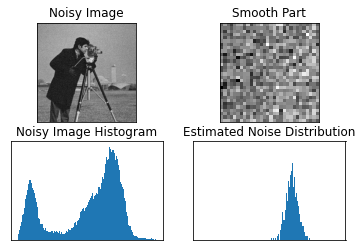

In [ ]:
plt.subplot(221),plt.imshow(noisy,cmap = 'gray')
plt.title('Noisy Image'), plt.xticks([]), plt.yticks([])
plt.subplot(222),plt.imshow(smooth_part,cmap = 'gray')
plt.title('Smooth Part'), plt.xticks([]), plt.yticks([])
plt.subplot(223),plt.hist(noisy.ravel(),256,[0,256])#; plt.show()
plt.title('Noisy Image Histogram'), plt.xticks([]), plt.yticks([])
plt.subplot(224),plt.hist(smooth_part.ravel(),256,[0,256])#; plt.show()
plt.title('Estimated Noise Distribution'), plt.xticks([]), plt.yticks([])
plt.show()

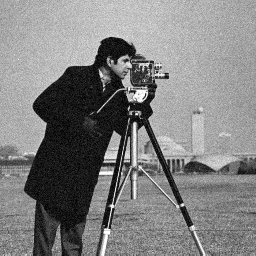

In [ ]:
cv2_imshow(noisy)

In [ ]:
cv2_imshow(smooth_part)

https://gist.github.com/Prasad9/28f6a2df8e8d463c6ddd040f4f6a028a

https://datacarpentry.org/image-processing/07-thresholding/

In [ ]:
row, col, ch = img1.shape
mean = 0
var = 0.1
sigma = var ** 0.5
gauss = np.random.normal(mean, sigma, (row, col, ch))
gauss = gauss.reshape(row, col, ch)
noisy = img1 + gauss

In [ ]:
print(noisy)

[[[ 58.40678076  75.92004198  59.01702095]
  [ 35.03714719  57.14223161  39.14260717]
  [ 67.71093629  99.86305021  78.63337643]
  ...
  [177.06316467 145.03089241 140.17836686]
  [175.70935857 144.41014744 139.07335553]
  [180.84549601 151.0914276  146.25818774]]

 [[ 47.63084546  64.22381523  46.82885486]
  [ 34.31442159  54.10379779  34.78284442]
  [ 60.9294142   88.81507486  69.26685562]
  ...
  [209.74918708 178.11101669 172.61462798]
  [248.79561187 219.24295636 213.95571639]
  [252.57364121 222.218403   217.10886713]]

 [[ 52.53920742  66.08139705  47.92421318]
  [ 35.11076866  51.88536166  30.92971447]
  [ 31.09110258  50.54775298  28.74477281]
  ...
  [237.21444096 205.05314609 199.8969418 ]
  [238.59542261 209.41201148 203.60908872]
  [253.86107779 223.78997514 218.67472069]]

 ...

 [[ 44.571869    57.4134154   29.25640037]
  [ 64.90088077  77.22289374  47.03413879]
  [ 47.37196023  55.12647752  23.67621146]
  ...
  [ 78.42041018  88.14477295  65.31790864]
  [ 79.81390093  9

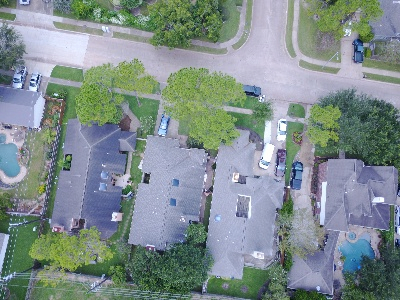

In [ ]:
cv2_imshow(noisy)